In [101]:
# Import Libraries
import numpy as np
import h5py
import matplotlib.pyplot as plt

# Import TF
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.layers import (Conv2D, MaxPooling2D, Input, UpSampling2D, LeakyReLU,
                                     Flatten, Dense, Dropout, BatchNormalization, Conv2DTranspose)
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping

# ROAD Dataset – Anomaly Detection


## Load Data


In [102]:
file_path = "/content/drive/MyDrive/Turion/ROAD_dataset.h5"

# Open and inspect the file keys
with h5py.File(file_path, 'r') as f:
    print("Top-level keys:", list(f.keys()))

Top-level keys: ['anomaly_data', 'test_data', 'train_data']


In [103]:
# Checking the group level sub-keys
with h5py.File(file_path, 'r') as f:
    for group_key in f.keys():
        print(f"\nGroup: {group_key}")
        group = f[group_key]
        print(" Sub-keys:", list(group.keys()))


Group: anomaly_data
 Sub-keys: ['first_order_data_loss', 'first_order_high_noise', 'galactic_plane', 'lightning', 'oscillating_tile', 'rfi_ionosphere_reflect', 'solar_storm', 'source_in_sidelobes', 'third_order_data_loss']

Group: test_data
 Sub-keys: ['data', 'frequency_band', 'ids', 'labels', 'source']

Group: train_data
 Sub-keys: ['data', 'frequency_band', 'ids', 'labels', 'source']


In [104]:
# Load data
with h5py.File(file_path, 'r') as f:
    # Load main training and testing data
    train_data = f['train_data']['data'][:]
    train_labels = f['train_data']['labels'][:]
    test_data = f['test_data']['data'][:]
    test_labels = f['test_data']['labels'][:]

    # Load all anomaly categories into a dictionary
    anomaly_data = {}
    for class_name in f['anomaly_data'].keys():
        group = f['anomaly_data'][class_name]
        if 'data' in group:
            anomaly_data[class_name] = group['data'][:]

In [105]:
# Check the size of 'data' and 'labels' in testing and training
print(f"Train shape: {train_data.shape}, Labels: {train_labels.shape}")
print(f"Test shape: {test_data.shape}, Labels: {test_labels.shape}")
print(f"Anomaly classes loaded: {list(anomaly_data.keys())}")

Train shape: (3687, 256, 256, 4), Labels: (3687,)
Test shape: (1000, 256, 256, 4), Labels: (1000,)
Anomaly classes loaded: ['first_order_data_loss', 'first_order_high_noise', 'galactic_plane', 'lightning', 'oscillating_tile', 'rfi_ionosphere_reflect', 'solar_storm', 'source_in_sidelobes', 'third_order_data_loss']


In [106]:
# List the sub-keys in anomaly group first_order_data_loss
with h5py.File(file_path, 'r') as f:
    first_order_data_loss_group = f['anomaly_data']['first_order_data_loss']
    print("Sub-keys in first_order_data_loss:", list(first_order_data_loss_group.keys()))

Sub-keys in first_order_data_loss: ['data', 'frequency_band', 'ids', 'labels', 'source']


In [107]:
# Print all anomaly types and their sample counts
with h5py.File(file_path, 'r') as f:
    print("Anomaly Types & Sample Counts:")
    for class_name in f['anomaly_data'].keys():
        group = f['anomaly_data'][class_name]
        if 'data' in group:
            data_shape = group['data'].shape
            print(f"{class_name:30s} → {data_shape[0]} samples")

Anomaly Types & Sample Counts:
first_order_data_loss          → 146 samples
first_order_high_noise         → 88 samples
galactic_plane                 → 550 samples
lightning                      → 389 samples
oscillating_tile               → 56 samples
rfi_ionosphere_reflect         → 261 samples
solar_storm                    → 147 samples
source_in_sidelobes            → 446 samples
third_order_data_loss          → 283 samples


In [108]:
# Count unique labels for training set
unique_train, counts_train = np.unique(train_labels, return_counts=True)
print("Train labels:")
for label, count in zip(unique_train, counts_train):
    print(f"{label}: {count} samples")

# Count unique labels for test set
unique_test, counts_test = np.unique(test_labels, return_counts=True)
print("\nTest labels:")
for label, count in zip(unique_test, counts_test):
    print(f"{label}: {count} samples")

Train labels:
b'': 3687 samples

Test labels:
b'': 1000 samples


In [109]:
print(train_labels[:10])

[b'' b'' b'' b'' b'' b'' b'' b'' b'' b'']


## Data Exploration & Visualization


In [110]:
# Func to plot anomaly samples
def plot_anomaly_sample(class_name, sample_index=0):
    sample = anomaly_data[class_name][sample_index]
    pol_labels = ["XX-polarisation", "XY-polarisation", "YX-polarisation", "YY-polarisation"]

    fig, axes = plt.subplots(2, 2, figsize=(12, 9))
    axes = axes.flatten()

    for i in range(4):
        img = np.log10(np.abs(sample[:, :, i]) + 1e-5)
        vmin, vmax = np.percentile(img, [0.5, 99.5])

        im = axes[i].imshow(img, aspect='auto', cmap='inferno', vmin=vmin, vmax=vmax)
        axes[i].set_title(f"{pol_labels[i]} (dB)", fontsize=12)
        plt.colorbar(im, ax=axes[i], fraction=0.046, pad=0.04)

        axes[i].set_ylabel("Frequency (MHz)")
        axes[i].set_xlabel("Time (arbitrary units)")

    fig.suptitle(f"{class_name.replace('_', ' ').title()} – Anomaly Example", fontsize=16)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

Plotting: first_order_data_loss


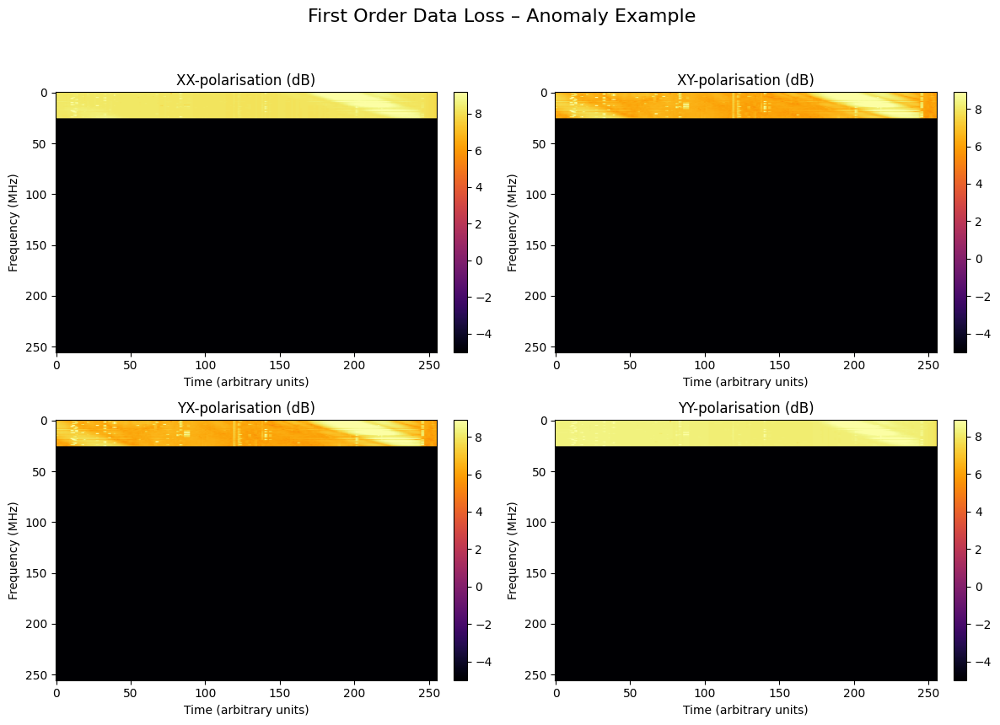

Plotting: first_order_high_noise


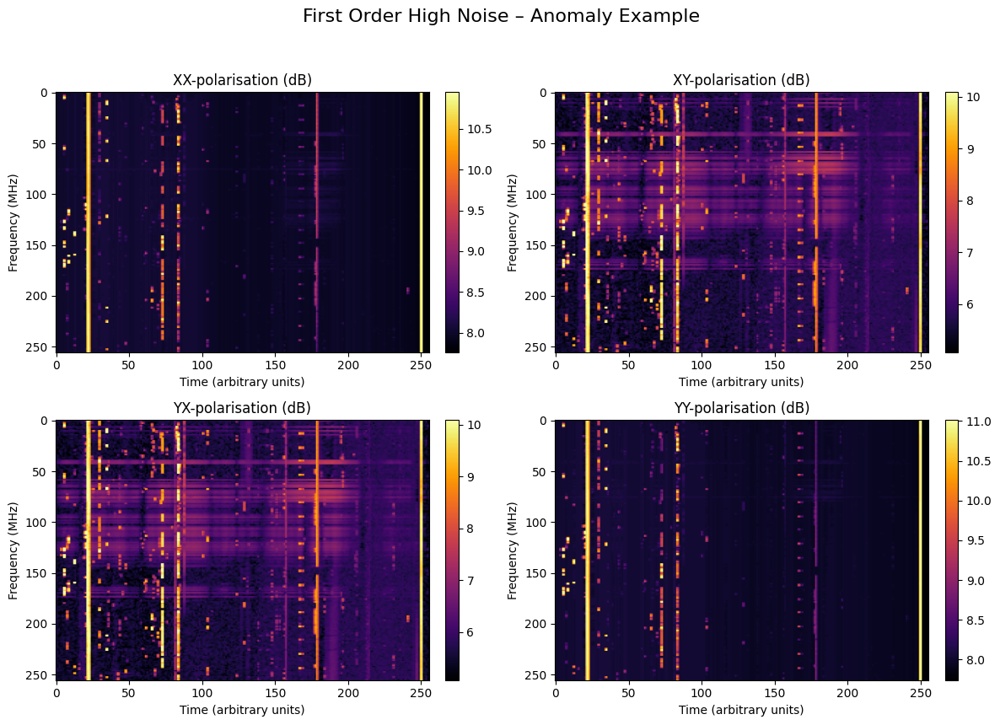

Plotting: galactic_plane


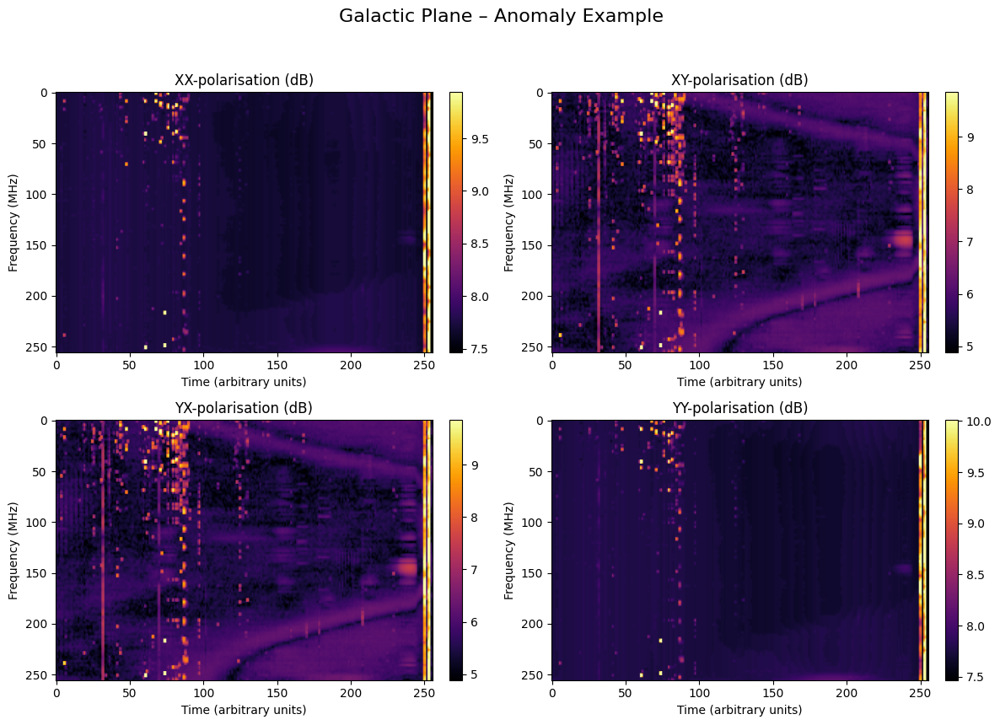

Plotting: lightning


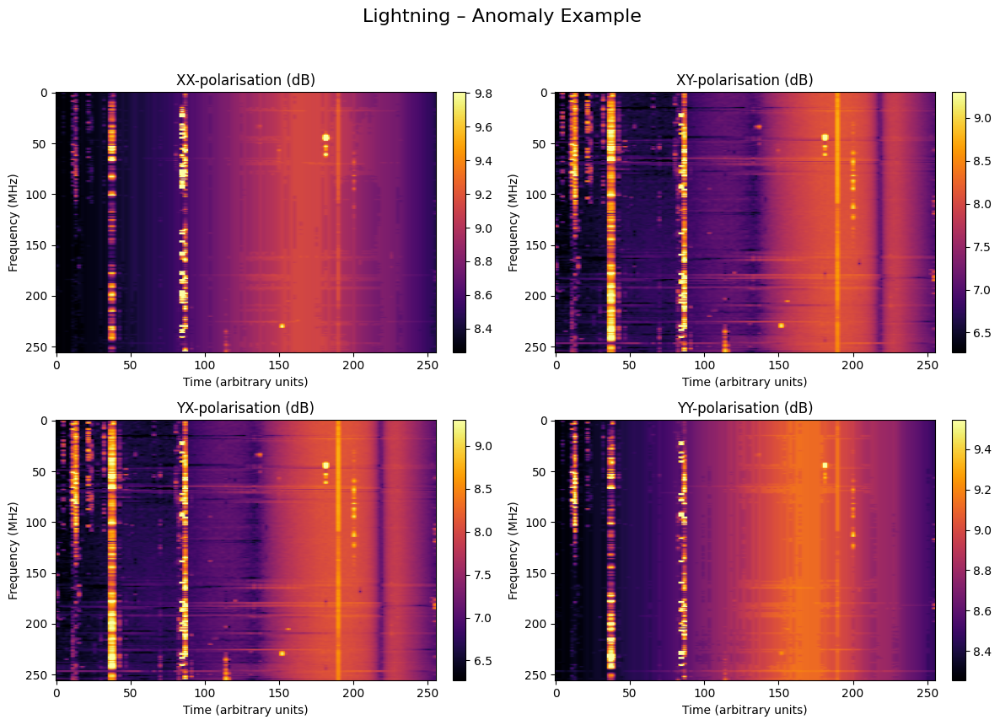

Plotting: oscillating_tile


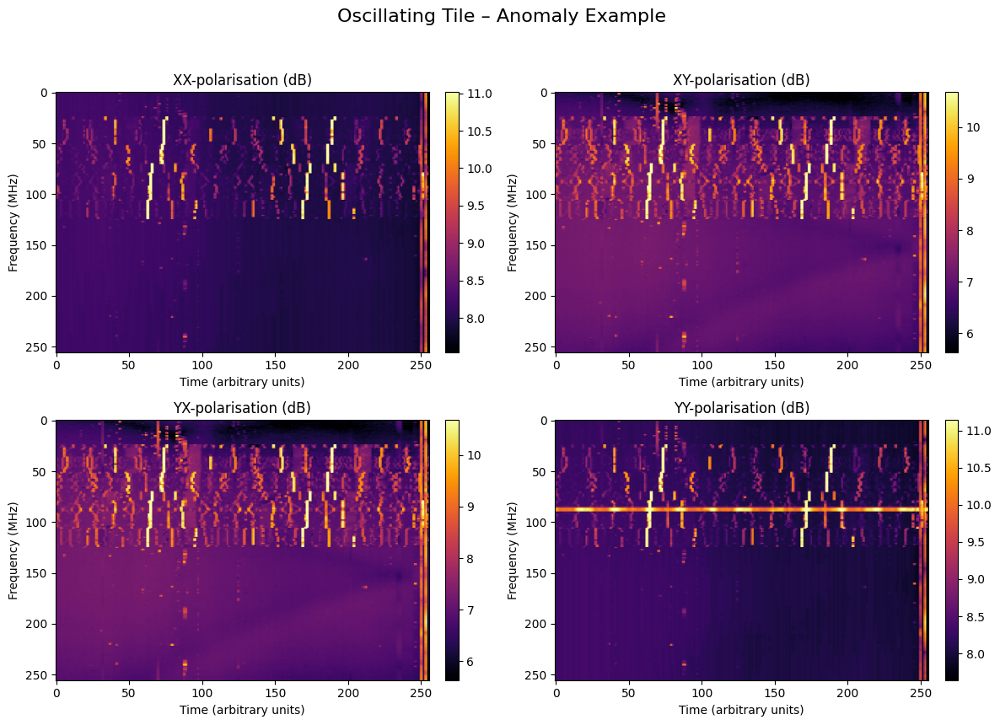

Plotting: rfi_ionosphere_reflect


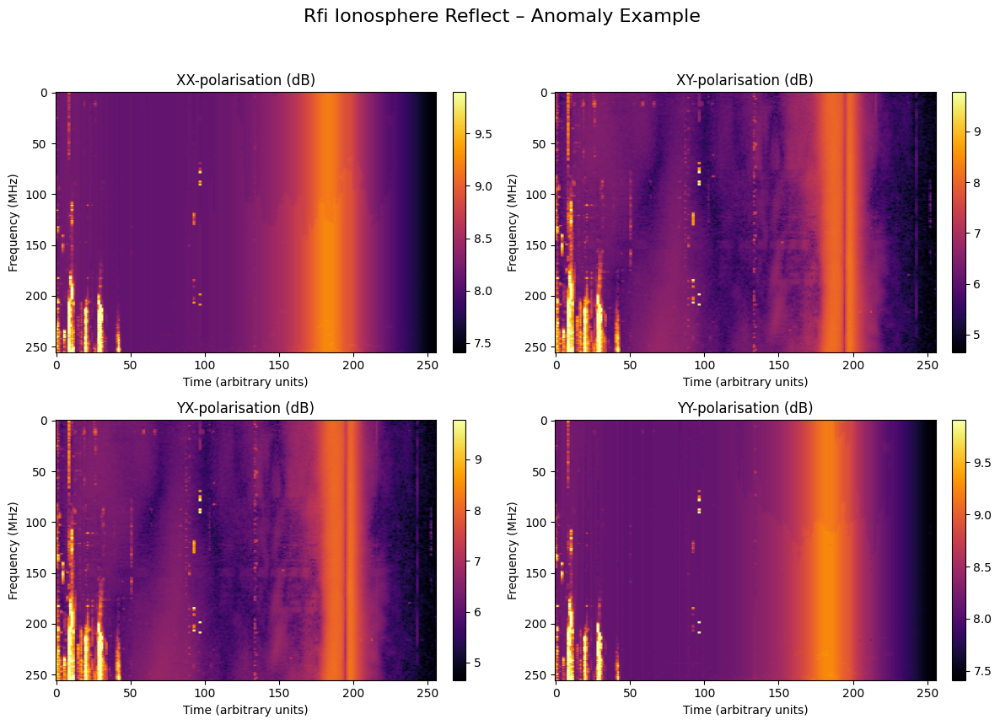

Plotting: solar_storm


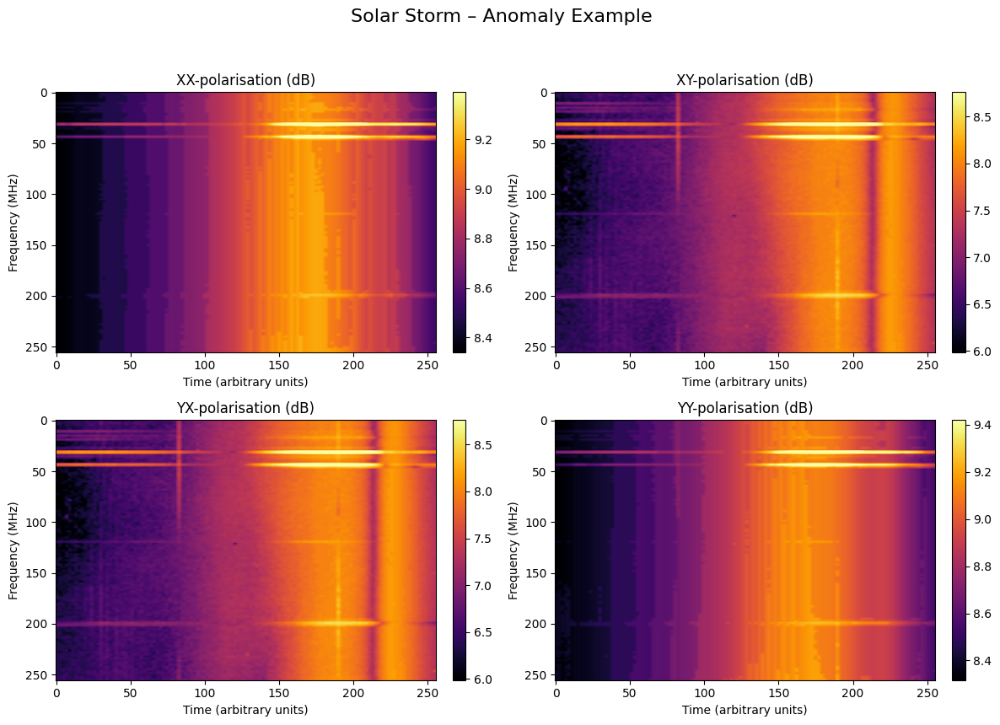

Plotting: source_in_sidelobes


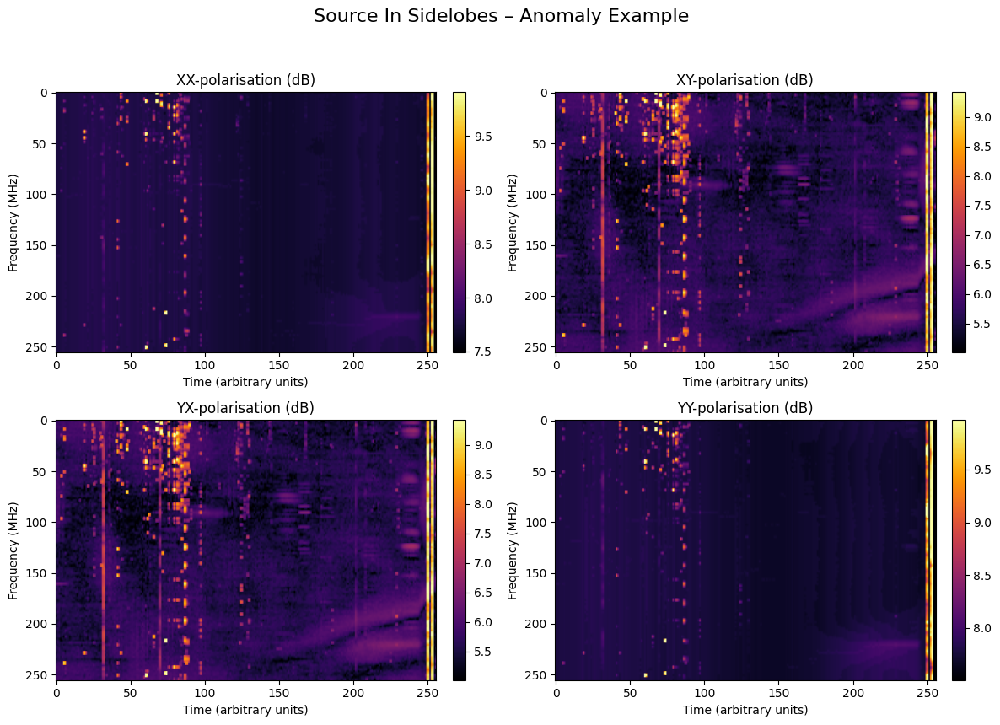

Plotting: third_order_data_loss


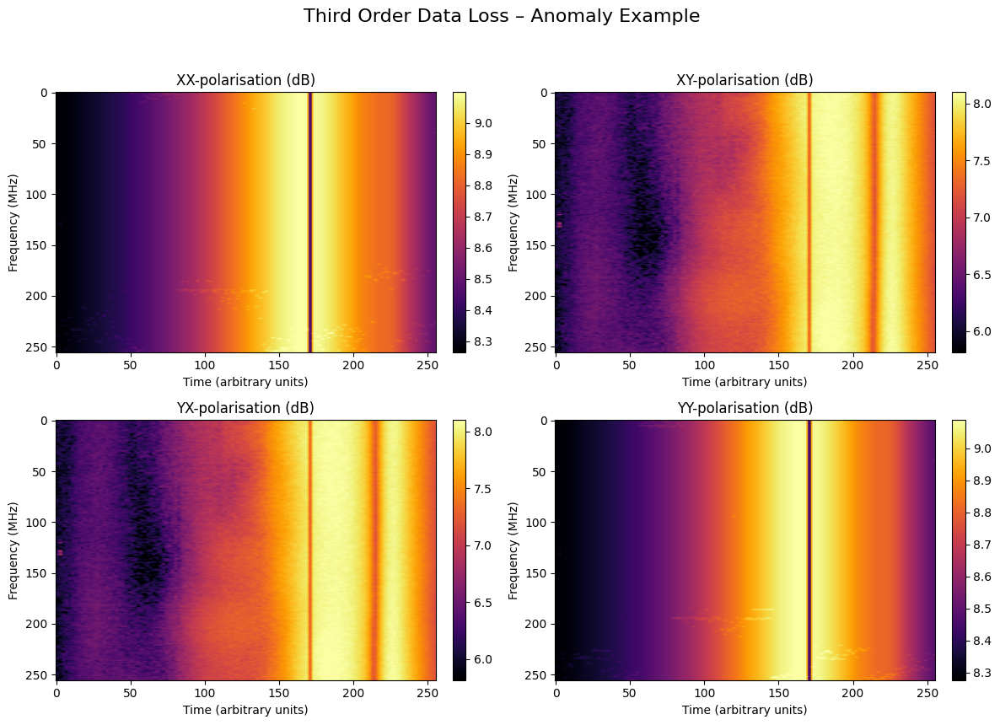

In [111]:
for class_name in anomaly_data.keys():
    print(f"Plotting: {class_name}")
    plot_anomaly_sample(class_name, sample_index = 10)

## Preprocessing

In [112]:
# Normalize data
X_train = train_data.astype("float32") / np.max(train_data)
X_test = test_data.astype("float32") / np.max(test_data)

# Check shape — we expect (samples, 256, 256, 4)
print("Train shape:", X_train.shape)
print("Test shape:", X_test.shape)

Train shape: (3687, 256, 256, 4)
Test shape: (1000, 256, 256, 4)


In [113]:
# Log Transformation (helps since some of the data is tiny)
X_train_log = np.log1p(X_train)
X_test_log = np.log1p(X_test)

In [114]:
# Data augmentation: add random cropped images and resize
def random_crop_and_resize(image, label):
    # Combine image and label for consistent augmentation
    image_shape = tf.shape(image)
    crop_scale = tf.random.uniform([], minval=0.75, maxval=1.0)
    new_height = tf.cast(crop_scale * tf.cast(image_shape[0], tf.float32), tf.int32)
    new_width = tf.cast(crop_scale * tf.cast(image_shape[1], tf.float32), tf.int32)

    image = tf.image.random_crop(image, size=[new_height, new_width, 4])
    image = tf.image.resize(image, [256, 256])  # Resize back

    return image, label

# Create validation split
split = int(len(X_train) * 0.9)
X_train_part = X_train[:split]
X_val_part = X_train[split:]

# Create dataset
BATCH_SIZE = 32
train_ds = tf.data.Dataset.from_tensor_slices((X_train_part, X_train_part))
train_ds = train_ds.map(random_crop_and_resize, num_parallel_calls=tf.data.AUTOTUNE)
train_ds = train_ds.shuffle(500).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)

val_ds = tf.data.Dataset.from_tensor_slices((X_val_part, X_val_part))
val_ds = val_ds.batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)

## Build Model

In [115]:
# Define loss function
def ssl_loss(lambda_reg=1e-6, lambda_recon=1.0):
    def loss_fn(y_true, y_pred):
        reconstructed, latent = y_pred

        # L1 reconstruction loss
        l1_loss = tf.reduce_mean(tf.abs(y_true - reconstructed))

        # Latent L2 regularization
        l2_loss = tf.reduce_mean(tf.square(latent))

        return lambda_recon * l1_loss + lambda_reg * l2_loss
    return loss_fn

In [116]:
# Building the autoencoder
input_layer = Input(shape=(256, 256, 4))

# Encoder
x = Conv2D(64, (3, 3), padding='same', strides=2)(input_layer)
x = BatchNormalization()(x)
x = LeakyReLU()(x)

x = Conv2D(128, (3, 3), padding='same', strides=2)(x)
x = BatchNormalization()(x)
x = LeakyReLU()(x)

x = Conv2D(256, (3, 3), padding='same', strides=2)(x)
x = BatchNormalization()(x)
x = LeakyReLU()(x)

encoded = Conv2D(512, (3, 3), padding='same', strides=2)(x)  # 16x16
encoded = BatchNormalization()(encoded)
encoded = LeakyReLU()(encoded)

# Decoder
x = Conv2DTranspose(256, (3, 3), padding='same', strides=2)(encoded)
x = BatchNormalization()(x)
x = LeakyReLU()(x)

x = Conv2DTranspose(128, (3, 3), padding='same', strides=2)(x)
x = BatchNormalization()(x)
x = LeakyReLU()(x)

x = Conv2DTranspose(64, (3, 3), padding='same', strides=2)(x)
x = BatchNormalization()(x)
x = LeakyReLU()(x)

decoded = Conv2DTranspose(4, (3, 3), padding='same', strides=2, activation='sigmoid')(x)

# Build model
autoencoder = Model(inputs=input_layer, outputs=decoded)
autoencoder.compile(optimizer=Adam(learning_rate=0.0005), loss='mae')

## Train and Evaluate

In [117]:
# Train with augmented dataset
history = autoencoder.fit(train_ds, validation_data=val_ds, epochs=20)

Epoch 1/20
104/104 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 0.3421 - val_loss: 0.2292
Epoch 2/20
104/104 ━━━━━━━━━━━━━━━━━━━━ 9s 81ms/step - loss: 0.0687 - val_loss: 0.0612
Epoch 3/20
104/104 ━━━━━━━━━━━━━━━━━━━━ 9s 81ms/step - loss: 0.0238 - val_loss: 0.0198
Epoch 4/20
104/104 ━━━━━━━━━━━━━━━━━━━━ 9s 81ms/step - loss: 0.0116 - val_loss: 0.0093
Epoch 5/20
104/104 ━━━━━━━━━━━━━━━━━━━━ 9s 81ms/step - loss: 0.0069 - val_loss: 0.0055
Epoch 6/20
104/104 ━━━━━━━━━━━━━━━━━━━━ 9s 81ms/step - loss: 0.0046 - val_loss: 0.0037
Epoch 7/20
104/104 ━━━━━━━━━━━━━━━━━━━━ 9s 81ms/step - loss: 0.0033 - val_loss: 0.0028
Epoch 8/20
104/104 ━━━━━━━━━━━━━━━━━━━━ 9s 81ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 9/20
104/104 ━━━━━━━━━━━━━━━━━━━━ 9s 81ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 10/20
104/104 ━━━━━━━━━━━━━━━━━━━━ 9s 81ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 11/20
104/104 ━━━━━━━━━━━━━━━━━━━━ 9s 81ms/step - loss: 0.0013 - val_loss: 0.0013
Epoch 12/20
104/104 ━━━━━━━━━━━━━━━━━━━

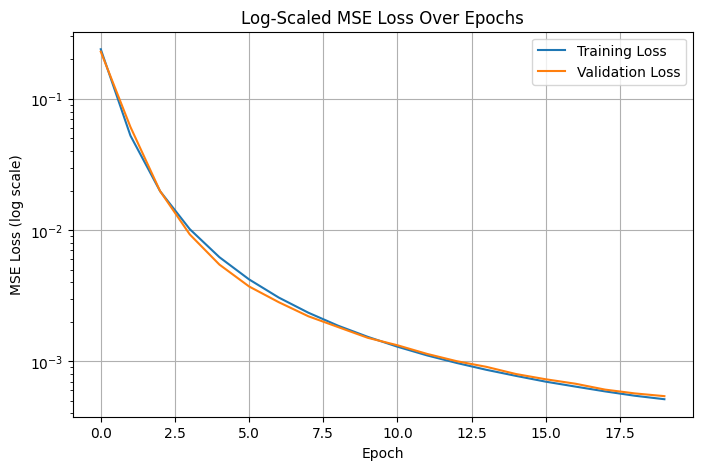

In [118]:
# Plot the training loss
plt.figure(figsize=(8, 5))
plt.semilogy(history.history['loss'], label='Training Loss')
plt.semilogy(history.history['val_loss'], label='Validation Loss')
plt.title('Log-Scaled MSE Loss Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('MSE Loss (log scale)')
plt.legend()
plt.grid(True)
plt.show()

32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 51ms/step


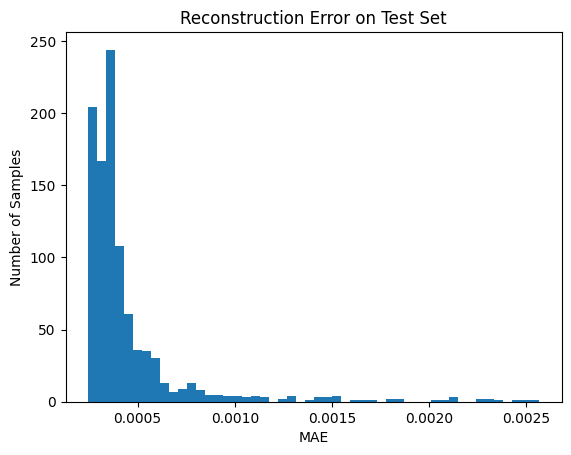

In [119]:
# Plot the error distributions on test data
X_test_recon = autoencoder.predict(X_test)
mae_per_sample = np.mean(np.abs(X_test - X_test_recon), axis=(1, 2, 3))

plt.hist(mae_per_sample, bins=50)
plt.title("Reconstruction Error on Test Set")
plt.xlabel("MAE")
plt.ylabel("Number of Samples")
plt.show()

In [120]:
def compute_ssim(original, reconstructed):
    # Expecting tensors with shape (batch, 256, 256, 4)
    ssim_per_channel = []
    for i in range(original.shape[-1]):
        ssim = tf.image.ssim(original[..., i:i+1],
                             reconstructed[..., i:i+1],
                             max_val=1.0)
        ssim_per_channel.append(ssim)

    ssim_mean = tf.reduce_mean(tf.stack(ssim_per_channel, axis=-1), axis=-1)  # average across channels
    return ssim_mean.numpy()  # shape: (batch,)

In [121]:
# Print SSIM Score
reconstructed = autoencoder.predict(X_test, batch_size=32)
ssim_scores = compute_ssim(X_test, reconstructed)

print("Average SSIM on test set:", np.mean(ssim_scores))

32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step
Average SSIM on test set: 0.99471456


## Anomaly Scoring & Thresholding

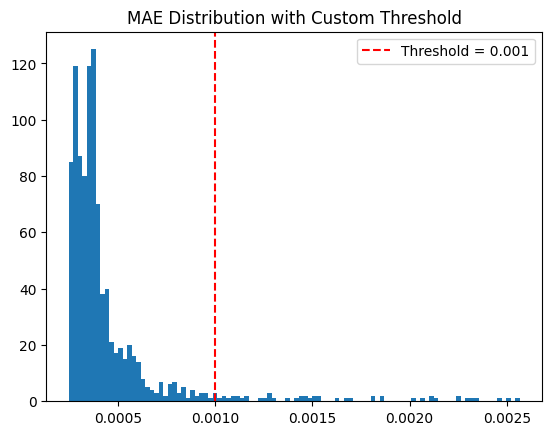

In [122]:
# Visualize set a threshhold at the tail end of the histogram
threshhold = 0.001
plt.hist(mae_per_sample, bins=100)
plt.axvline(0.001, color='red', linestyle='--', label=f'Threshold = {threshhold}')
plt.legend()
plt.title("MAE Distribution with Custom Threshold")
plt.show()

In [123]:
np.sum(mae_per_sample > threshhold), np.mean(mae_per_sample), np.max(mae_per_sample)
print(f"{np.sum(mae_per_sample > threshhold)} anomalies detected")

48 anomalies detected


In [124]:
print("Train min:", X_train.min(), "| max:", X_train.max())

Train min: 1.8341786e-12 | max: 1.0


## Plot Results and Summary

In [125]:
def plot_original_vs_reconstruction(index, mae):
    original = X_test[index]
    reconstructed = X_test_recon[index]

    fig, axes = plt.subplots(2, 4, figsize=(14, 6))
    pol_labels = ["XX", "XY", "YX", "YY"]

    for i in range(4):
        axes[0, i].imshow(original[:, :, i], cmap='inferno', aspect='auto')
        axes[0, i].set_title(f"Original - {pol_labels[i]}")
        axes[1, i].imshow(reconstructed[:, :, i], cmap='inferno', aspect='auto')
        axes[1, i].set_title(f"Reconstruction - {pol_labels[i]}")

    fig.suptitle(f"Sample {index} | MAE = {mae:.5f}", fontsize=16)
    plt.tight_layout()
    plt.show()

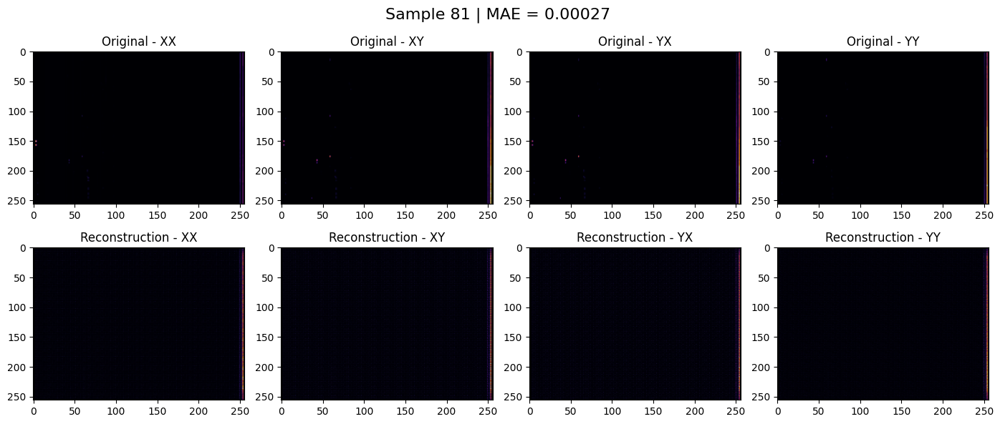

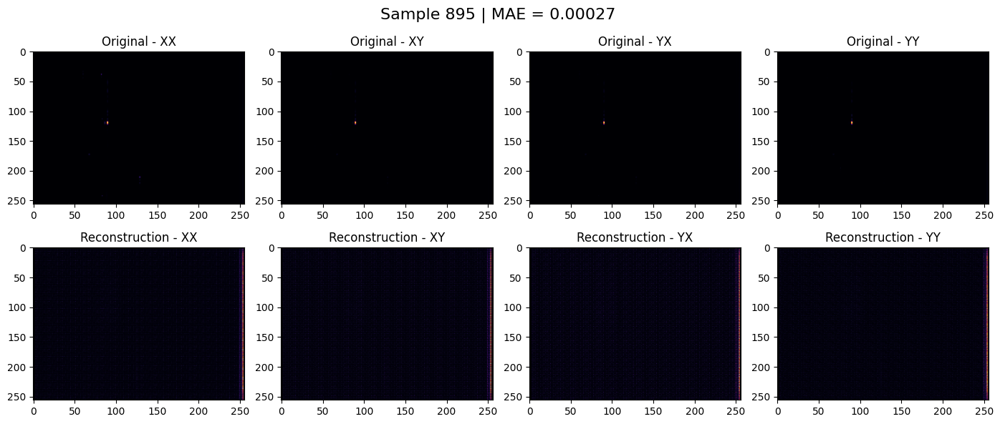

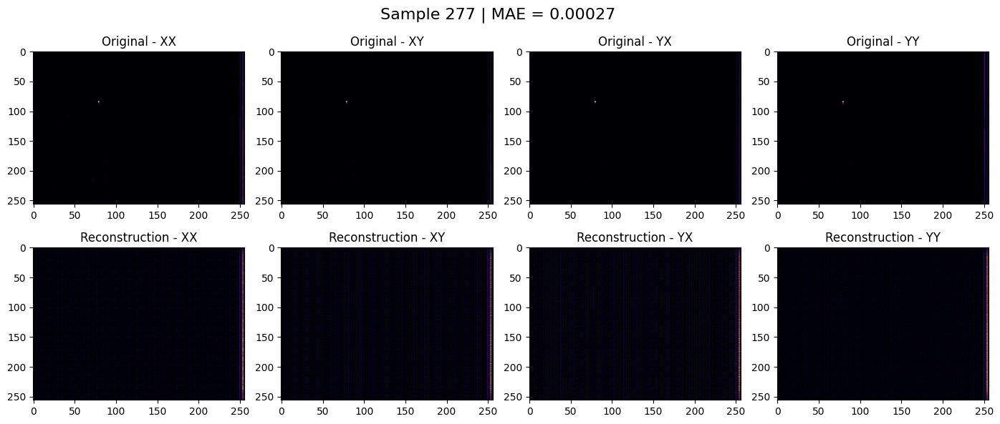

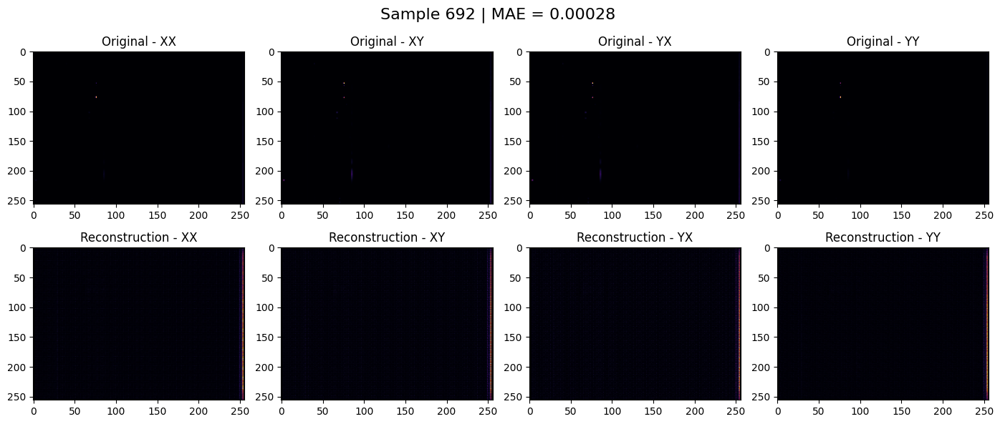

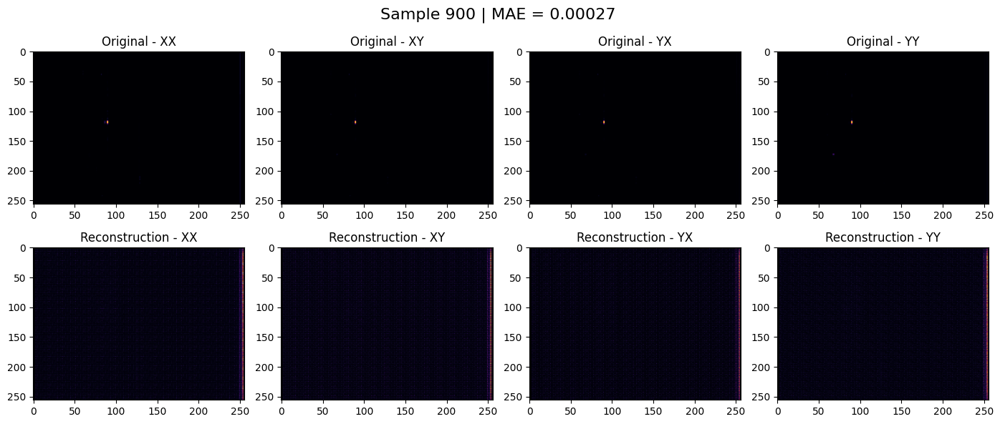

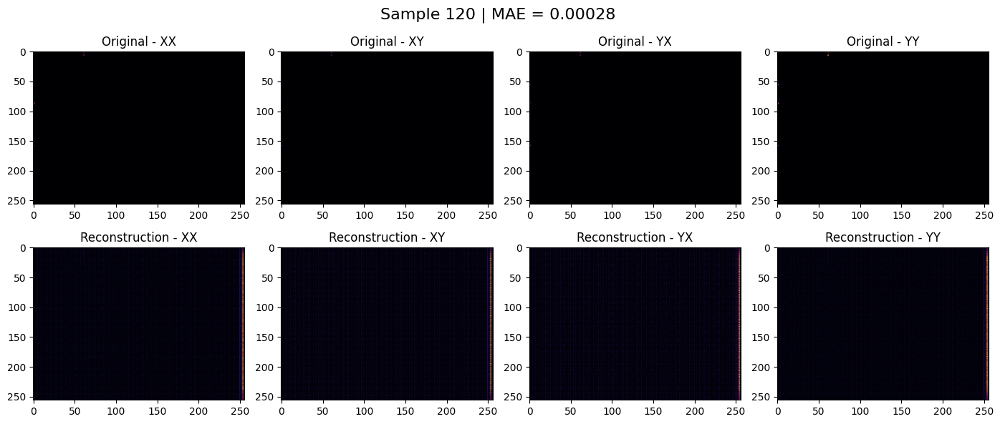

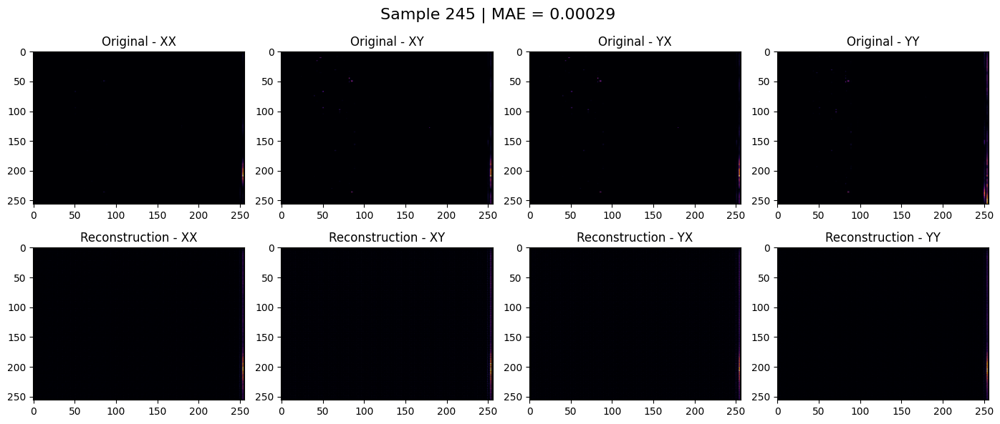

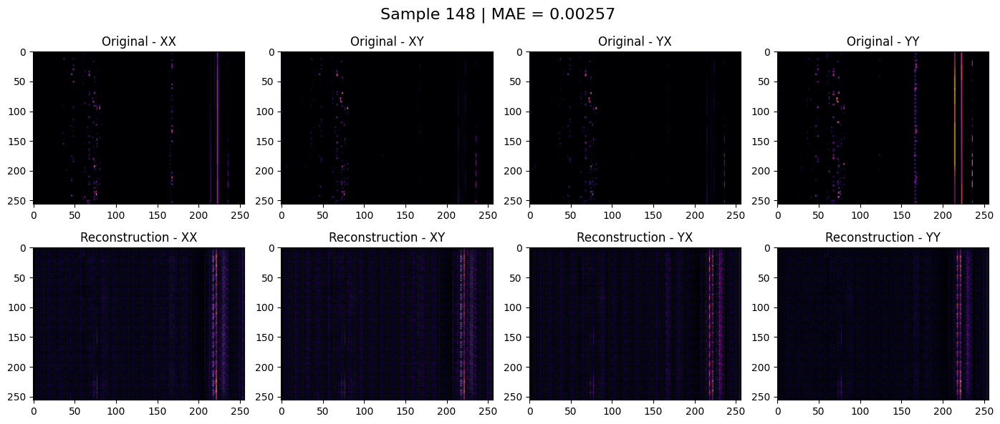

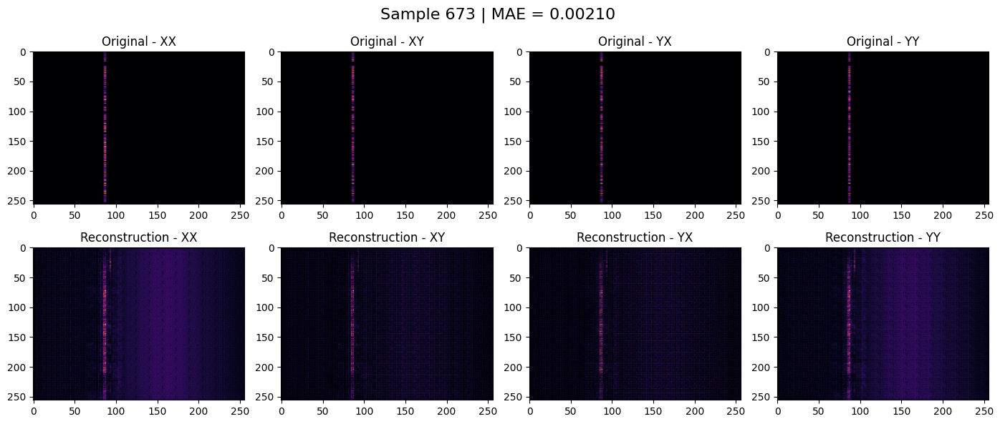

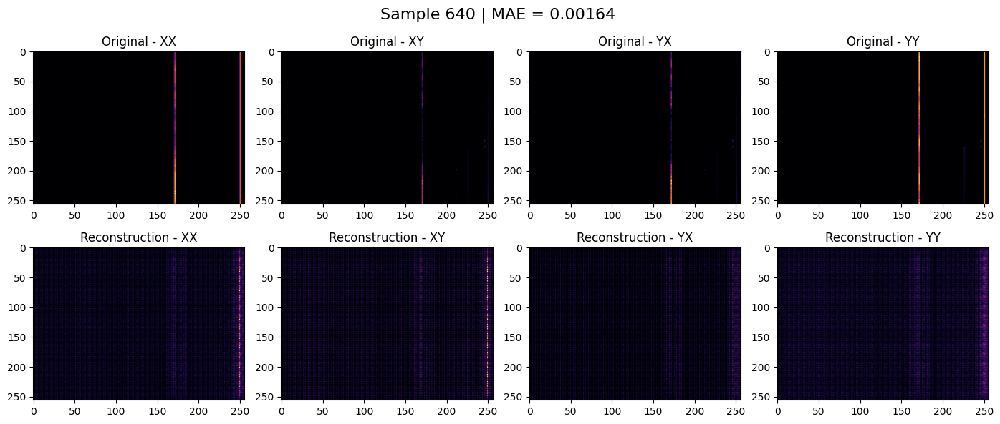

In [143]:
# Sort all MAEs
sorted_indices = np.argsort(mae_per_sample)

# Select specific positions from the sorted list
selected_best = sorted_indices[[1, 10, 50, 100]]   # good reconstructions
selected_worst = sorted_indices[[-1, -10, -20, -30]]  # bad ones from the end

# Plot
for idx in selected_best:
    plot_original_vs_reconstruction(idx, mae_per_sample[idx])

for idx in selected_worst:
    plot_original_vs_reconstruction(idx, mae_per_sample[idx])

## Additional Hyperparameter Exploration

In [146]:
input_layer = Input(shape=(256, 256, 4))

# Encoder (adding dropout)
x = Conv2D(64, (3, 3), padding='same', strides=2)(input_layer)
x = BatchNormalization()(x)
x = LeakyReLU()(x)
x = Dropout(0.3)(x)

x = Conv2D(128, (3, 3), padding='same', strides=2)(x)
x = BatchNormalization()(x)
x = LeakyReLU()(x)
x = Dropout(0.3)(x)

x = Conv2D(256, (3, 3), padding='same', strides=2)(x)
x = BatchNormalization()(x)
x = LeakyReLU()(x)
x = Dropout(0.3)(x)

# changing latent representation, changing layers
encoded = Conv2D(256, (3, 3), padding='same', strides=2)(x)  # 16x16
encoded = BatchNormalization()(encoded)
encoded = LeakyReLU()(encoded)

# Decoder
x = Conv2DTranspose(256, (3, 3), padding='same', strides=2)(encoded)
x = BatchNormalization()(x)
x = LeakyReLU()(x)

x = Conv2DTranspose(128, (3, 3), padding='same', strides=2)(x)
x = BatchNormalization()(x)
x = LeakyReLU()(x)

x = Conv2DTranspose(64, (3, 3), padding='same', strides=2)(x)
x = BatchNormalization()(x)
x = LeakyReLU()(x)

decoded = Conv2DTranspose(4, (3, 3), padding='same', strides=2, activation='sigmoid')(x)

# Build model
autoencoder = Model(input_layer, decoded)
autoencoder.compile(optimizer=Adam(learning_rate=0.001), loss='mae') # exploring learning rates

In [147]:
history_lr = autoencoder.fit(X_train, X_train, epochs=10, batch_size=32, validation_split=0.1)

Epoch 1/10
104/104 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.3086 - val_loss: 0.0811
Epoch 2/10
104/104 ━━━━━━━━━━━━━━━━━━━━ 8s 79ms/step - loss: 0.0169 - val_loss: 0.0108
Epoch 3/10
104/104 ━━━━━━━━━━━━━━━━━━━━ 8s 79ms/step - loss: 0.0051 - val_loss: 0.0036
Epoch 4/10
104/104 ━━━━━━━━━━━━━━━━━━━━ 8s 80ms/step - loss: 0.0025 - val_loss: 0.0019
Epoch 5/10
104/104 ━━━━━━━━━━━━━━━━━━━━ 8s 79ms/step - loss: 0.0016 - val_loss: 0.0013
Epoch 6/10
104/104 ━━━━━━━━━━━━━━━━━━━━ 8s 80ms/step - loss: 0.0011 - val_loss: 0.0010
Epoch 7/10
104/104 ━━━━━━━━━━━━━━━━━━━━ 8s 80ms/step - loss: 8.6283e-04 - val_loss: 8.3503e-04
Epoch 8/10
104/104 ━━━━━━━━━━━━━━━━━━━━ 8s 80ms/step - loss: 6.9023e-04 - val_loss: 6.9783e-04
Epoch 9/10
104/104 ━━━━━━━━━━━━━━━━━━━━ 8s 80ms/step - loss: 5.8285e-04 - val_loss: 6.0247e-04
Epoch 10/10
104/104 ━━━━━━━━━━━━━━━━━━━━ 8s 79ms/step - loss: 4.9603e-04 - val_loss: 5.1182e-04


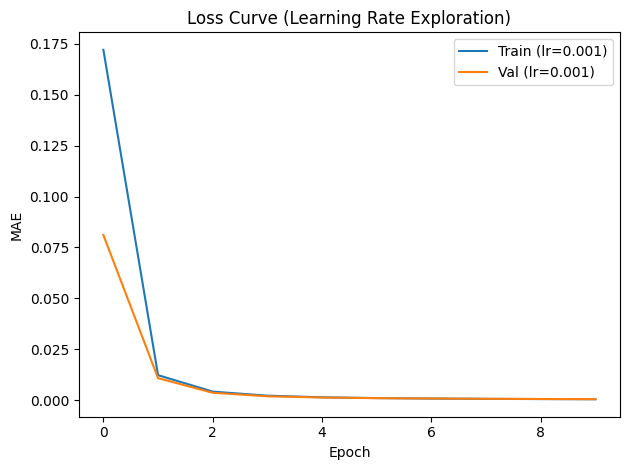

In [149]:
plt.plot(history_lr.history['loss'], label='Train (lr=0.001)')
plt.plot(history_lr.history['val_loss'], label='Val (lr=0.001)')
plt.title('Loss Curve (Learning Rate Exploration)')
plt.xlabel('Epoch')
plt.ylabel('MAE')
plt.legend()
plt.tight_layout()
plt.show()

In [150]:
# Print SSIM Score
reconstructed = autoencoder.predict(X_test, batch_size=32)
ssim_scores = compute_ssim(X_test, reconstructed)

print("Average SSIM on test set:", np.mean(ssim_scores))

32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step
Average SSIM on test set: 0.99580204


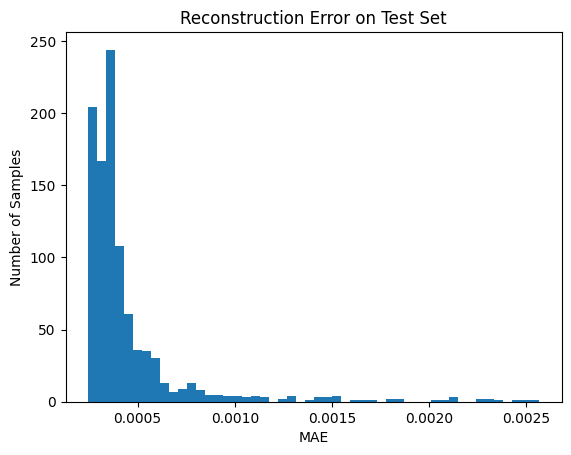

In [151]:
# Plot the error distributions on test data
mae_per_sample = np.mean(np.abs(X_test - X_test_recon), axis=(1, 2, 3))

plt.hist(mae_per_sample, bins=50)
plt.title("Reconstruction Error on Test Set")
plt.xlabel("MAE")
plt.ylabel("Number of Samples")
plt.show()